In [31]:
# Update sklearn to prevent version mismatches
#!pip install sklearn --upgrade

In [32]:
# install joblib. This will be used to save your model. 
# Restart your kernel after installing 
#!pip install joblib

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style("darkgrid")
from collections import Counter
import os

# Read the CSV and Perform Basic Data Cleaning

In [34]:
df = pd.read_csv(os.path.join(".","Resources","exoplanet_data.csv"))
df.head()

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,CONFIRMED,0,0,0,0,54.418383,2.479000e-04,-2.479000e-04,162.513840,0.003520,...,-81,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,FALSE POSITIVE,0,1,0,0,19.899140,1.490000e-05,-1.490000e-05,175.850252,0.000581,...,-176,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
2,FALSE POSITIVE,0,1,0,0,1.736952,2.630000e-07,-2.630000e-07,170.307565,0.000115,...,-174,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
3,CONFIRMED,0,0,0,0,2.525592,3.760000e-06,-3.760000e-06,171.595550,0.001130,...,-211,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
4,CONFIRMED,0,0,0,0,4.134435,1.050000e-05,-1.050000e-05,172.979370,0.001900,...,-232,4.486,0.054,-0.229,0.972,0.315,-0.105,296.28613,48.224670,15.714


In [35]:
# Dimesion
df.shape

(6991, 41)

In [36]:
# Metadata
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6991 entries, 0 to 6990
Data columns (total 41 columns):
koi_disposition      6991 non-null object
koi_fpflag_nt        6991 non-null int64
koi_fpflag_ss        6991 non-null int64
koi_fpflag_co        6991 non-null int64
koi_fpflag_ec        6991 non-null int64
koi_period           6991 non-null float64
koi_period_err1      6991 non-null float64
koi_period_err2      6991 non-null float64
koi_time0bk          6991 non-null float64
koi_time0bk_err1     6991 non-null float64
koi_time0bk_err2     6991 non-null float64
koi_impact           6991 non-null float64
koi_impact_err1      6991 non-null float64
koi_impact_err2      6991 non-null float64
koi_duration         6991 non-null float64
koi_duration_err1    6991 non-null float64
koi_duration_err2    6991 non-null float64
koi_depth            6991 non-null float64
koi_depth_err1       6991 non-null float64
koi_depth_err2       6991 non-null float64
koi_prad             6991 non-null float64

In [37]:
# Verifying if any null values
df.isnull().sum()


koi_disposition      0
koi_fpflag_nt        0
koi_fpflag_ss        0
koi_fpflag_co        0
koi_fpflag_ec        0
koi_period           0
koi_period_err1      0
koi_period_err2      0
koi_time0bk          0
koi_time0bk_err1     0
koi_time0bk_err2     0
koi_impact           0
koi_impact_err1      0
koi_impact_err2      0
koi_duration         0
koi_duration_err1    0
koi_duration_err2    0
koi_depth            0
koi_depth_err1       0
koi_depth_err2       0
koi_prad             0
koi_prad_err1        0
koi_prad_err2        0
koi_teq              0
koi_insol            0
koi_insol_err1       0
koi_insol_err2       0
koi_model_snr        0
koi_tce_plnt_num     0
koi_steff            0
koi_steff_err1       0
koi_steff_err2       0
koi_slogg            0
koi_slogg_err1       0
koi_slogg_err2       0
koi_srad             0
koi_srad_err1        0
koi_srad_err2        0
ra                   0
dec                  0
koi_kepmag           0
dtype: int64

In [38]:
df.isna().sum()

koi_disposition      0
koi_fpflag_nt        0
koi_fpflag_ss        0
koi_fpflag_co        0
koi_fpflag_ec        0
koi_period           0
koi_period_err1      0
koi_period_err2      0
koi_time0bk          0
koi_time0bk_err1     0
koi_time0bk_err2     0
koi_impact           0
koi_impact_err1      0
koi_impact_err2      0
koi_duration         0
koi_duration_err1    0
koi_duration_err2    0
koi_depth            0
koi_depth_err1       0
koi_depth_err2       0
koi_prad             0
koi_prad_err1        0
koi_prad_err2        0
koi_teq              0
koi_insol            0
koi_insol_err1       0
koi_insol_err2       0
koi_model_snr        0
koi_tce_plnt_num     0
koi_steff            0
koi_steff_err1       0
koi_steff_err2       0
koi_slogg            0
koi_slogg_err1       0
koi_slogg_err2       0
koi_srad             0
koi_srad_err1        0
koi_srad_err2        0
ra                   0
dec                  0
koi_kepmag           0
dtype: int64

In [39]:
# Descriptive Statics
df.describe()

,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,koi_time0bk_err2,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
count,6991.000000,6991.000000,6991.000000,6991.000000,6991.000000,6.991000e+03,6.991000e+03,6991.000000,6991.000000,6991.000000,...,6991.000000,6991.000000,6991.000000,6991.00000,6991.000000,6991.000000,6991.000000,6991.000000,6991.000000,6991.000000
mean,0.157059,0.244743,0.202975,0.125018,56.191248,1.851122e-03,-1.851122e-03,164.488820,0.009340,-0.009340,...,-161.206980,4.305049,0.121091,-0.14048,1.740749,0.352710,-0.388568,292.082406,43.812143,14.271508
std,0.363882,0.429966,0.402243,0.330763,117.570962,7.184503e-03,7.184503e-03,67.020475,0.021989,0.021989,...,71.448481,0.439238,0.132048,0.08199,5.903415,0.839017,1.907797,4.762908,3.606167,1.350802
min,0.000000,0.000000,0.000000,0.000000,0.259820,1.100000e-08,-1.568000e-01,120.515914,0.000009,-0.569000,...,-1733.000000,0.047000,0.000000,-1.00700,0.109000,0.000000,-103.825000,279.856080,36.577381,6.966000
25%,0.000000,0.000000,0.000000,0.000000,2.620126,5.005000e-06,-2.401000e-04,132.683917,0.001145,-0.010000,...,-197.000000,4.209000,0.044000,-0.19500,0.829000,0.128000,-0.252000,288.704730,40.797760,13.455000
50%,0.000000,0.000000,0.000000,0.000000,8.947426,3.300000e-05,-3.300000e-05,136.739230,0.003990,-0.003990,...,-159.000000,4.436000,0.070000,-0.12700,0.999000,0.248000,-0.111000,292.314760,43.679661,14.534000
75%,0.000000,0.000000,0.000000,0.000000,34.282605,2.401000e-04,-5.005000e-06,169.937005,0.010000,-0.001145,...,-112.000000,4.543000,0.149000,-0.08800,1.357000,0.357000,-0.069000,295.888550,46.693659,15.322000
max,1.000000,1.000000,1.000000,1.000000,1071.232624,1.568000e-01,-1.100000e-08,1472.522306,0.569000,-0.000009,...,0.000000,5.364000,1.472000,0.00000,180.013000,25.956000,0.000000,301.720760,52.336010,19.065000


_Analysis_ : koi_period (The interval between consecutive planetary transits. ) has a maximum value of 1071 whereas the mean is 56.19 and 75percentile is under 34. Similarly, koi_time0bk has a max value of 1472 where as the mean value is 164. Will not remove these max values as not sure if these are expected.

In [40]:
# Drop the null columns where all values are null
df = df.dropna(axis='columns', how='all')
# Drop the null rows
df = df.dropna()
df.head()

,koi_disposition,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,CONFIRMED,0,0,0,0,54.418383,2.479000e-04,-2.479000e-04,162.513840,0.003520,...,-81,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,FALSE POSITIVE,0,1,0,0,19.899140,1.490000e-05,-1.490000e-05,175.850252,0.000581,...,-176,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
2,FALSE POSITIVE,0,1,0,0,1.736952,2.630000e-07,-2.630000e-07,170.307565,0.000115,...,-174,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
3,CONFIRMED,0,0,0,0,2.525592,3.760000e-06,-3.760000e-06,171.595550,0.001130,...,-211,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
4,CONFIRMED,0,0,0,0,4.134435,1.050000e-05,-1.050000e-05,172.979370,0.001900,...,-232,4.486,0.054,-0.229,0.972,0.315,-0.105,296.28613,48.224670,15.714


# EDA

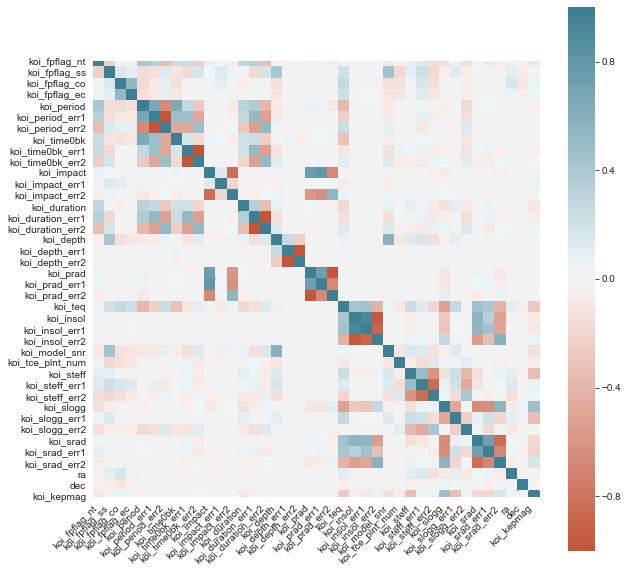

In [41]:
#sns.pairplot(df_selected_features, hue='koi_disposition', palette='coolwarm')
plt.figure(figsize=(10,10))
df_corr = df.corr()
ax = sns.heatmap(
    df_corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

## Select needed features (columns)

### Removing all 'error' value columns from selected features for model building 

In [42]:
# Set features. This will also be used as your x values.
# Using only those columns without errors as features
df_selected_features = df[df.columns.drop(list(df.filter(regex='err')))]
df_selected_features.columns

Index(['koi_disposition', 'koi_fpflag_nt', 'koi_fpflag_ss', 'koi_fpflag_co',
       'koi_fpflag_ec', 'koi_period', 'koi_time0bk', 'koi_impact',
       'koi_duration', 'koi_depth', 'koi_prad', 'koi_teq', 'koi_insol',
       'koi_model_snr', 'koi_tce_plnt_num', 'koi_steff', 'koi_slogg',
       'koi_srad', 'ra', 'dec', 'koi_kepmag'],
      dtype='object')

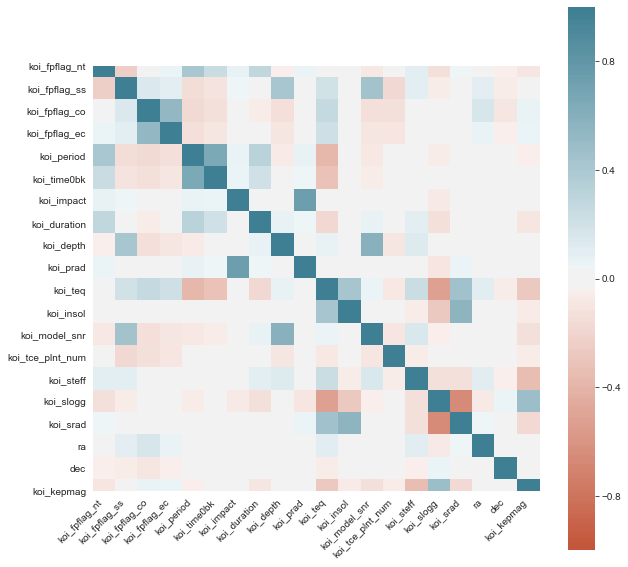

In [43]:
plt.figure(figsize=(10,10))
df_selected_corr = df_selected_features.corr()
ax = sns.heatmap(
    df_selected_corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

## Checking for any imbalance with Target feature

In [44]:
# Checking the frequency of target values
df["koi_disposition"].value_counts()

FALSE POSITIVE    3504
CONFIRMED         1800
CANDIDATE         1687
Name: koi_disposition, dtype: int64

,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,koi_time0bk_err2,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
koi_disposition,,,,,,,,,,,,,,,,,,,,,
CANDIDATE,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,...,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026,24.131026
CONFIRMED,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,...,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390,25.747390
FALSE POSITIVE,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,...,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585,50.121585


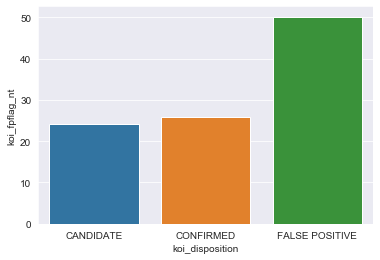

In [45]:
# Doing a frequency analysis on various 'koi_disposition'
total = len(df)
dis_fre = df.groupby('koi_disposition').count()/total * 100
sns.barplot(x= dis_fre.index, y=dis_fre['koi_fpflag_nt'],data=dis_fre,)
dis_fre

Analysis: In the provided dataset, we can see that 50% of the data consists of 'False Positives'. This can affect the prediction as data is imbalanced.

## Defining Features and Target variables

In [46]:
X = df_selected_features.drop('koi_disposition', axis=1)
y = df_selected_features['koi_disposition']

## Making the dataset balanced by SMOTE

In [47]:
#!pip install imblearn

In [48]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)


In [49]:
X_res, y_res = sm.fit_resample(X, y)

In [50]:
print('Resampled dataset shape %s' % Counter(y_res))
print(X_res.shape)
print(y_res.shape)

Resampled dataset shape Counter({'CONFIRMED': 3504, 'FALSE POSITIVE': 3504, 'CANDIDATE': 3504})
(10512, 20)
(10512,)


# Create a Train Test Split

Use `koi_disposition` for the y values

In [51]:
# Importing all libraries
from sklearn.model_selection import train_test_split


In [52]:
## Using re-sampled data
X_train, X_test, y_train, y_test = train_test_split(
    X_res, y_res, random_state=42, stratify=y_res)

# Label Encoding for Y labels

In [78]:
# Label Encoding
from sklearn.preprocessing import LabelEncoder
# Step 1: Label-encode data set
label_encoder = LabelEncoder()
label_encoder.fit(y_train)
encoded_y_train = label_encoder.transform(y_train)
encoded_y_test = label_encoder.transform(y_test)
for label, original_class in zip(encoded_y_train, y_train):
    print('Original Class: ' + str(original_class))
    print('Encoded Label: ' + str(label))
    print('-' * 12)
target_names = ['CANDIDATE', 'CONFIRMED', 'FALSE POSITIVE']

Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
En

Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Clas

Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label

------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALS

------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original C

Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Ori

Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
En

Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
En

Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label

------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------


------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Origi

------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------


------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class:

------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class:

Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Enc

------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------


Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Clas

------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Origi

------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
---

Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
-----------

Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIV

Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
En

Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Ori

------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: FALSE POSITIVE
Encoded Label: 2
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CONFIRMED
Encoded Label: 1
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original Class: CANDIDATE
Encoded Label: 0
------------
Original C

In [54]:
encoded_y_train.shape

(7884,)

# Scaling of X features

Scale the data using the MinMaxScaler

In [55]:
from sklearn.preprocessing import MinMaxScaler
# Scale your data
scaler = MinMaxScaler()
X_scaler = scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Decision Tree Model

**Import DecisionTreeClassifier**

In [56]:
from sklearn.tree import DecisionTreeClassifier


**Create an instance of DecisionTreeClassifier() called dtree and fit it to the training data.**

In [57]:
dtree = DecisionTreeClassifier()

In [58]:
dtree.fit(X_train_scaled,encoded_y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

**Validate the model using Test Data**

In [59]:
# Calculate the R2 score for the test data
# YOUR CODE HERE
print(f"Test data Score is :{dtree.score(X_test_scaled,encoded_y_test)}")

Test data Score is :0.871765601217656


## Tree Visualization

In [60]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot

C:\Users\indum\Anaconda3\envs\mlenv37\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [61]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=X.columns,filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png()) 

## Create a Random Forest model

### Train and fit the Model

In [62]:
# Importing the library
from sklearn.ensemble import RandomForestClassifier

In [63]:
rfc = RandomForestClassifier(n_estimators=600)

In [64]:
rfc.fit(X_train_scaled, encoded_y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

## Validate the model using Test Data

In [67]:
from sklearn.metrics import classification_report,confusion_matrix
print(f"Training Data Score: {rfc.score(X_train_scaled, encoded_y_train)}")
print(f"Testing Data Score: {rfc.score(X_test_scaled, encoded_y_test)}")

Training Data Score: 1.0
Testing Data Score: 0.923896499238965


**Random Forest model has given a better f-score** of **0.92** that Decision tree model one.(0.87) on test data.

## Predictions and Evaluations

In [71]:
y_predicted = rfc.predict(X_test_scaled)
prediction_labels = label_encoder.inverse_transform(y_predicted)


In [72]:
pd.DataFrame({"Prediction": prediction_labels, "Actual": y_test}).reset_index(drop=True)

,Prediction,Actual
0,FALSE POSITIVE,FALSE POSITIVE
1,CANDIDATE,CANDIDATE
2,CANDIDATE,CANDIDATE
3,CONFIRMED,CONFIRMED
4,CANDIDATE,CANDIDATE
...,...,...
2623,CONFIRMED,CONFIRMED
2624,CANDIDATE,CANDIDATE
2625,CANDIDATE,CANDIDATE
2626,CONFIRMED,CANDIDATE


### Validation

In [73]:
from sklearn.metrics import classification_report,confusion_matrix

In [75]:
print(confusion_matrix(encoded_y_test,y_predicted))

[[764 104   8]
 [ 82 789   5]
 [  1   0 875]]


In [79]:
print(classification_report(encoded_y_test,y_predicted, target_names=target_names))

                precision    recall  f1-score   support

     CANDIDATE       0.90      0.87      0.89       876
     CONFIRMED       0.88      0.90      0.89       876
FALSE POSITIVE       0.99      1.00      0.99       876

      accuracy                           0.92      2628
     macro avg       0.92      0.92      0.92      2628
  weighted avg       0.92      0.92      0.92      2628



Analysis: Overall Accuracy is 0.92 and has a very high accuracy in predicting 'false positive's. (0.99) and 0.89 for 'candidate' a 0.89 for 'confirmed'. Looks like re-sampling hasn't helped in improving accuracy for 2 categories that were under-represneted.

# Hyperparameter Tuning

Use `GridSearchCV` to tune the model's parameters

In [80]:
# Import GridSearchCV
from sklearn.model_selection import GridSearchCV

**Creating Parameter Grid**

In [81]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [3, 4],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 600]
}

In [82]:
# Create the GridSearchCV model
grid = GridSearchCV(rfc,param_grid,refit=True,verbose=2)

In [ ]:
# Train the model with GridSearch
# Fit the model using the grid search estimator. 
# This will take the rfc model and try each combination of parameters
grid.fit(X_train_scaled, encoded_y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 


C:\Users\indum\Anaconda3\envs\mlenv37\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s


[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   1.4s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   1.6s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   2.4s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   2.6s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samp

[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   1.2s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   1.8s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   3.0s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samp

[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=600, total=   7.8s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   1.3s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   1.7s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_sam

[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=600, total=   8.0s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=600, total=   7.8s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   1.2s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   2.2s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_s

[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=600, total=  10.5s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=600, total=   9.4s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=600, total=  13.2s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   2.1s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=4, min

[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   5.5s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=600, total=   9.8s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=600, total=   9.8s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=600, total=  10.9s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=4, m

[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   4.7s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   5.4s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=600, total=  10.1s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=600, total=  10.5s
[CV] bootstrap=True, max_depth=80, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=80, max_features=4, 

[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   4.7s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   4.6s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=600, total=   8.1s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=90, max_features=3, 

[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   3.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=600 
[CV]  bootstrap=True, max_depth=90, max_features=3, 

[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   2.7s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   3.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   3.8s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, 

[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   3.7s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   3.5s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   4.2s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   4.7s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=4, 

[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   1.2s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   4.1s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   3.6s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   3.7s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=4, 

[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   1.9s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   2.3s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   2.9s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   3.6s
[CV] bootstrap=True, max_depth=90, max_features=4, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=4, 

[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   2.2s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   2.5s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=600, total=   8.3s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   1.7s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   1.4s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=600, total=   8.5s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=600, total=   7.8s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   1.6s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=600, total=  11.3s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=600, total=  10.4s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=600, total=  10.0s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   2.1s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   4.6s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=600, total=  10.1s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=600, total=   9.6s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=10, n_estimators=600, total=   9.9s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   4.6s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   5.3s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=600, total=   9.8s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=600, total=  10.9s
[CV] bootstrap=True, max_depth=100, max_features=4, min_samples_leaf=5, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   4.3s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   4.2s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=600, total=   8.2s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=110, max_fea

[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.9s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   4.5s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   3.9s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   4.0s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=600 
[CV]  bootstrap=True, max_depth=110, max_fea

[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.9s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   3.0s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   3.9s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   3.9s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_fea

[CV]  bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   2.9s
[CV] bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   3.3s
[CV] bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   4.1s
[CV] bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   4.7s
[CV] bootstrap=True, max_depth=110, max_features=4, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_fea

In [ ]:
print(grid.best_params_)
print(grid.best_score_)

** Now take that grid model and create some predictions using the test set and create classification reports and confusion matrices for them. Were you able to improve?**

# Save the Model

In [ ]:
# save your model by updating "your_name" with your name
# and "your_model" with your model variable
# be sure to turn this in to BCS
# if joblib fails to import, try running the command to install in terminal/git-bash
import joblib
filename = 'your_name.sav'
joblib.dump(your_model, filename)